In [1]:
import matplotlib.pyplot as plt
import seaborn as sns
from textwrap import fill
import numpy as np
import pandas as pd
import scanpy.external as sce
import scanpy as sc
import anndata as an
from scipy.spatial.distance import cdist
import scvelo as scv
# import gget
import re
# import rapids_singlecell as rsc
from scipy.stats import linregress
from scipy.stats import spearmanr
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from tqdm import tqdm
from statsmodels.stats.multitest import multipletests

# import cellrank as cr

sc.settings.verbosity = 3 

print(scv.__version__)

0.3.3


In [2]:
import warnings
warnings.filterwarnings("ignore")

import logging
logging.getLogger('py.warnings').setLevel(logging.ERROR)

# Load expression

In [3]:
%%time
fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/new_scvelo.h5ad"
# fpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/new_pseudotime.h5ad"
adata = sc.read_h5ad(fpath)
# adata.X = adata.layers['log_norm'].copy()
adata

CPU times: user 408 ms, sys: 8.74 s, total: 9.15 s
Wall time: 58.8 s


AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'
    var: 'gene_id', 'gene_type', 

In [4]:
# new cluster names
new_grouping = {  
    'R2': ['C1'],
    'R1': ['C2'],
    'C5': ['C3'],
    'C4': ['C4'],
    'R3': ['C5'],
}

# Invert the mapping: from old -> new
reverse_map = {old: new for new, olds in new_grouping.items() for old in olds}

adata.obs['cluster_str'] = adata.obs['cluster_str'].astype(str)

# create new grouping
adata.obs['cluster'] = adata.obs['cluster_str'].map(reverse_map)
adata.obs['cluster'] = adata.obs['cluster'].astype('category')

adata.obs['cluster_str'] = adata.obs['cluster_str'].astype('category')

print(adata.obs['cluster'].value_counts())

# define custom palette
clusters = adata.obs['cluster'].cat.categories
print(clusters)

cluster_colors = {
    'R1': '#02A679',
    'R2': '#D55E00',
    'R3': '#F9CF86',
    'C4': '#FFA9E6',
    'C5': '#5C5D9E',
}

adata.uns['cluster_colors'] = [cluster_colors[c] for c in clusters]

cluster
C4    4612
R2    4343
C5    3852
R1    1986
R3     524
Name: count, dtype: int64
Index(['C4', 'C5', 'R1', 'R2', 'R3'], dtype='object')


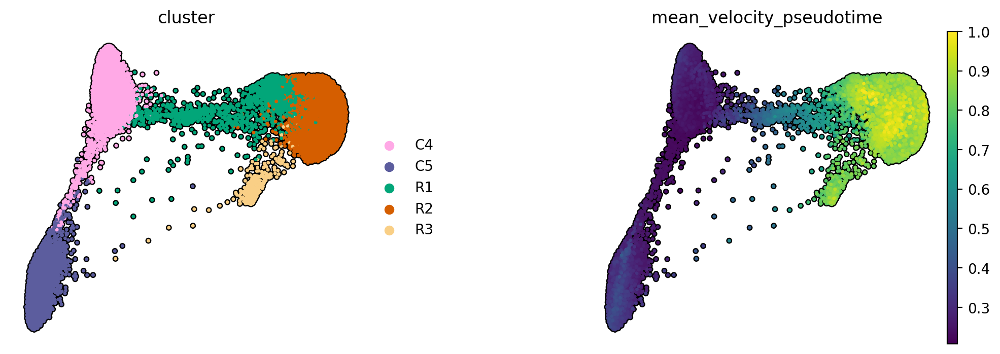

In [5]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['cluster', 'mean_velocity_pseudotime'],
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.5,
)

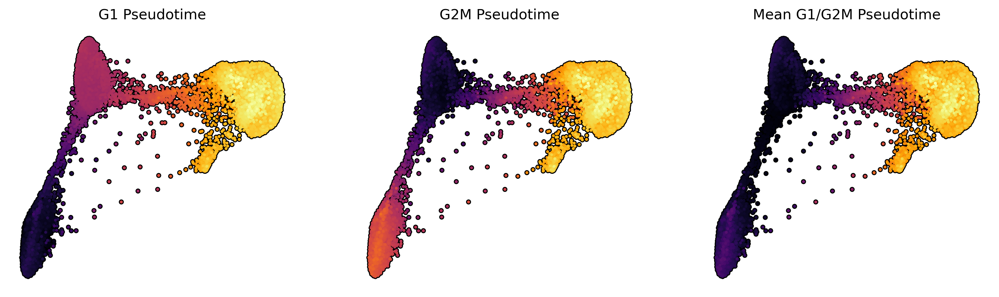

In [5]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'],
    size=25,
    ncols=3,
    alpha=1,
    cmap='inferno',
    use_raw=False,
    na_in_legend=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title=['G1 Pseudotime', 'G2M Pseudotime', 'Mean G1/G2M Pseudotime'],
    frameon=False,
    colorbar_loc=None,
)

# Load velocity

In [10]:
# %%time

# fpaths = {
#     "hsc" : "/scratch/indikar_root/indikar1/shared_data/hsc_velocyto/merged_NKUVW.loom",
#     "fib" : "/scratch/indikar_root/indikar1/shared_data/fib_velocyto/merged_PW6SH.loom",
# }

# ldatas = []
# for key, fpath in fpaths.items():
#     print(f"Working {key}...")

#     ldata = sc.read_loom(fpath)
#     ldata.var_names_make_unique()

#     # set the cell-ids back to barcodes
#     ldata.obs['velocyto_cell_id'] = ldata.obs_names.copy()
#     ldata.obs['cell_id'] = ldata.obs['velocyto_cell_id'].apply(lambda x: x.split(":")[1][:-1] + "-1")
    
#     if key == 'fib':
#         ldata.obs['cell_id'] = ldata.obs['cell_id'] + '_fib'
#     else:
#         ldata.obs['cell_id'] = ldata.obs['cell_id'] + '_hsc'
        
#     ldata.obs_names = ldata.obs['cell_id'].values

#     # Print initial cell counts
#     print(f"\tInitial cell count in ldata: {ldata.shape[0]}")
#     print(f"\tInitial cell count in adata: {adata.shape[0]}")
    
#     # IDs not retained in ldata
#     removed_from_ldata = ldata.obs.index[~ldata.obs.index.isin(adata.obs_names)].tolist()
    
#     # IDs not retained in adata
#     removed_from_adata = adata.obs.index[~adata.obs.index.isin(ldata.obs_names)].tolist()
    
#     # Filter ldata to keep only cells present in adata
#     initial_ldata_count = ldata.shape[0]
#     ldata = ldata[ldata.obs.index.isin(adata.obs_names), :].copy()
#     print(f"\tFiltered ldata: {ldata.shape[0]} cells kept, {initial_ldata_count - ldata.shape[0]} cells removed")

#     ldatas.append(ldata)

    
# ldata = an.concat(ldatas)   
# ldata

Working hsc...
	Initial cell count in ldata: 11933
	Initial cell count in adata: 15317
	Filtered ldata: 8357 cells kept, 3576 cells removed
Working fib...
	Initial cell count in ldata: 8963
	Initial cell count in adata: 15317
	Filtered ldata: 6960 cells kept, 2003 cells removed
CPU times: user 50.2 s, sys: 13.9 s, total: 1min 4s
Wall time: 1min 4s


AnnData object with n_obs × n_vars = 15317 × 38606
    obs: 'velocyto_cell_id', 'cell_id'
    layers: 'matrix', 'ambiguous', 'spliced', 'unspliced'

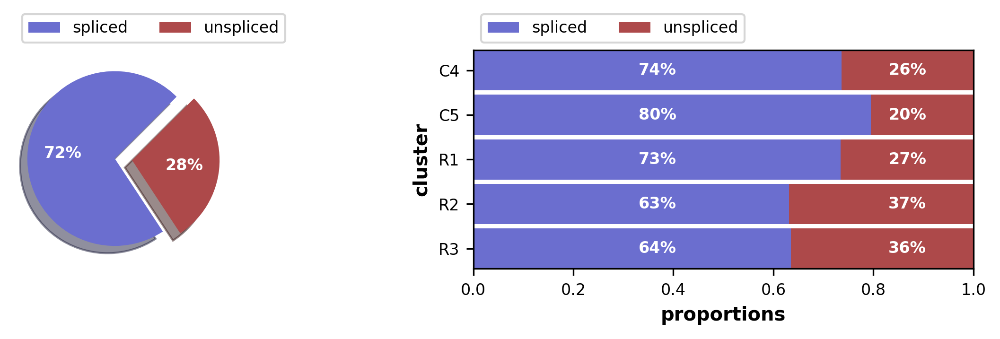

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime', 'cluster'
    var: 'gene_id', 'g

In [7]:
# adata = scv.utils.merge(adata, ldata)

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 5

scv.pl.proportions(adata,
                   groupby='cluster',
                   dpi=300,
                   layers=['spliced', 'unspliced'],
                  )

adata

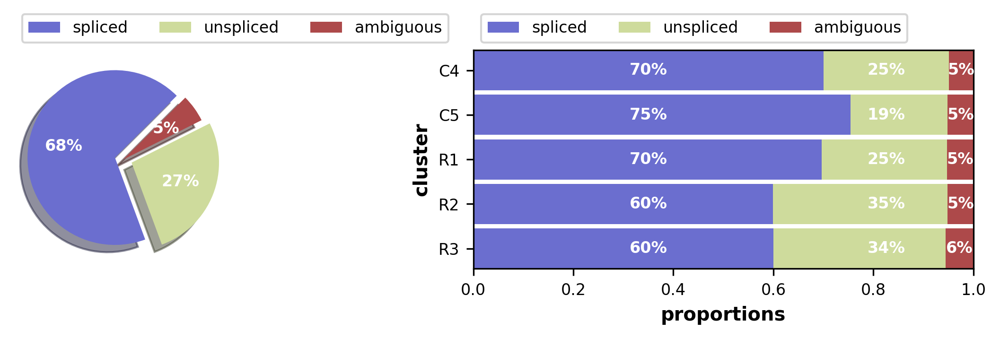

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime', 'cluster'
    var: 'gene_id', 'g

In [33]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 5

scv.pl.proportions(adata, groupby='cluster', dpi=300)

adata

In [12]:
%%time
sc.pp.neighbors(adata, n_neighbors=150, use_rep='X_pca_harmony')
scv.pp.moments(adata, use_rep='X_pca_harmony')

scv.tl.recover_dynamics(adata, n_jobs=8) 

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:50)
Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:15) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
recovering dynamics (using 8/40 cores)
or disable the progress bar using `show_progress_bar=False`.


/nfs/turbo/umms-indikar/Jillian/conda-envs/scvelo/lib/python3.13/multiprocessing/popen_fork.py:67: DeprecationWarning: This process (pid=188147) is multi-threaded, use of fork() may lead to deadlocks in the child.
  self.pid = os.fork()


    finished (0:13:09) --> added 
    'fit_pars', fitted parameters for splicing dynamics (adata.var)
CPU times: user 2min 42s, sys: 46.8 s, total: 3min 28s
Wall time: 14min 18s


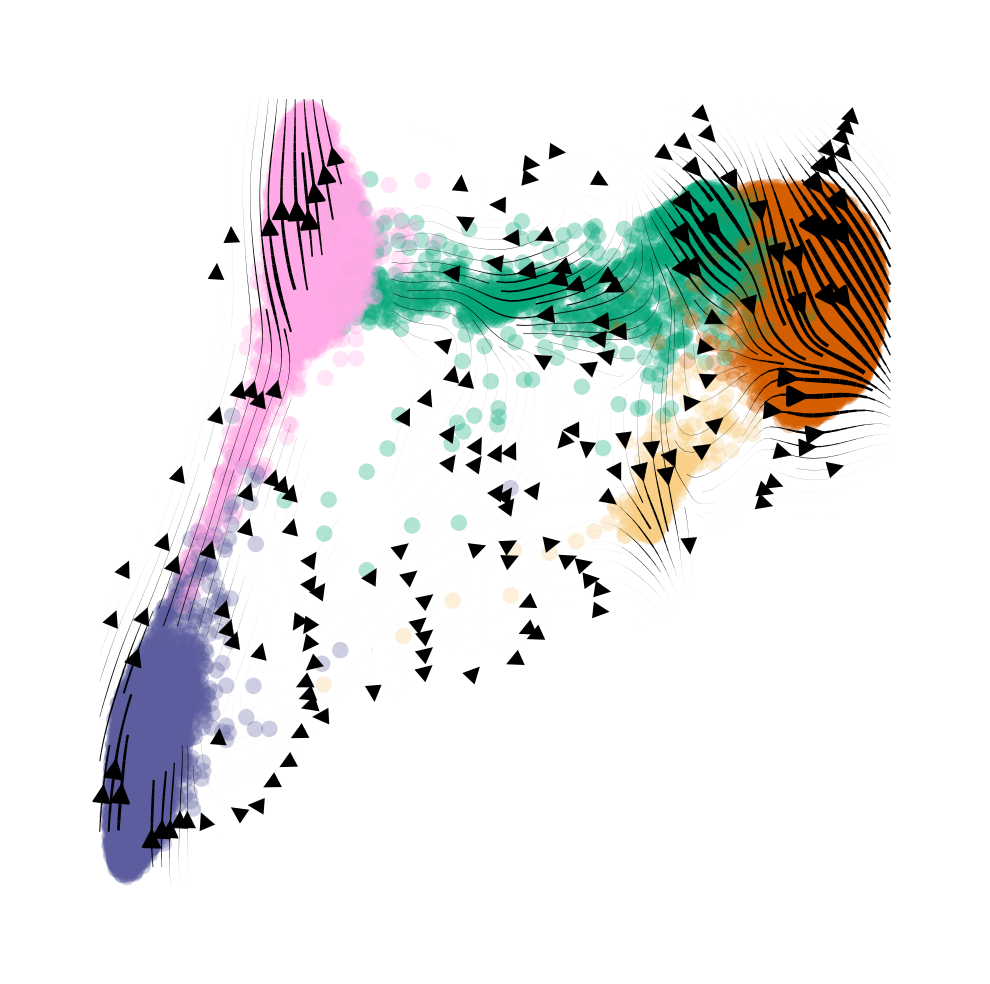

CPU times: user 2.61 s, sys: 16.3 ms, total: 2.63 s
Wall time: 2.65 s


In [12]:
%%time
# scv.tl.velocity(adata, mode='dynamical')
# scv.tl.velocity(adata)

# scv.tl.velocity_graph(
#     adata, 
#     n_jobs=8,
#     basis='X_pca_harmony',
#     n_neighbors=150,
# )

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

scv.pl.velocity_embedding_stream(
    adata, 
    density=(3, 3),
    basis='X_draw_graph_fa',
    color='cluster',
    smooth=True,
    title="",
    legend_loc='none',
    # legend_loc='right_margin',
    linewidth=0.75,
    arrow_size=1,
    add_margin=0.1,
)

G1: root_id='CGTAAAGGTTCGTGGC-1_fib' root_key=11683
G2M: root_id='AGAGAATCATTCGCTA-1_fib' root_key=9410


/nfs/turbo/umms-indikar/Jillian/conda-envs/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Jillian/conda-envs/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/umms-indikar/Jillian/conda-envs/scvelo/lib/python3.13/site-packages/scvelo/plotting/utils.py:68: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/nfs/turbo/um

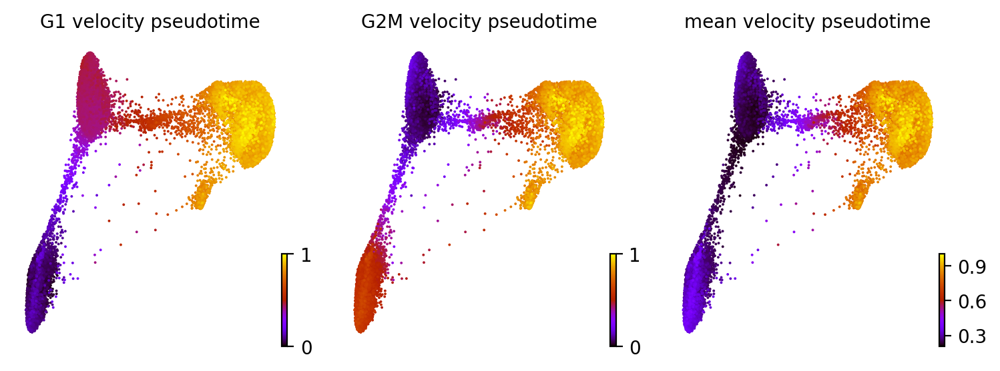

CPU times: user 23.3 s, sys: 25.4 s, total: 48.7 s
Wall time: 42.5 s


In [16]:
%%time
def find_closest_cell(adata, obs_key='barcoded_phase', value='G1', obsm_key='X_pca'):
    """
    Find the cell closest to a median vector in PCA space.

    Parameters:
        adata (AnnData): Annotated data matrix.
        obs_key (str): Key in adata.obs indicating group
        value (str): The value for aggregation 
        obsm_key (str): Key in adata.obsm for PCA or other embedding.

    Returns:
        tuple: (cell_id (str), index (int)) of the closest G1 cell in adata.obs_names
    """
    mask = adata.obs[obs_key] == value
    emb = adata.obsm[obsm_key][mask]

    median_vec = np.median(emb, axis=0)
    dists = cdist(emb, median_vec.reshape(1, -1)).flatten()
    closest_idx = np.argmin(dists)

    cell_id = adata.obs_names[mask][closest_idx]
    cell_index = np.where(adata.obs_names == cell_id)[0][0]

    return cell_id, cell_index

# loop through initial state
for phase, cluster in zip(['G1', 'G2M'], ['C3', 'C4']):
    root_id, root_key = find_closest_cell(
        adata,
        obs_key='cluster_str',
        value=cluster,
    )

    print(f"{phase}: {root_id=} {root_key=}")

    scv.tl.velocity_pseudotime(adata, root_key=root_key)
    adata.obs[f'{phase}_velocity_pseudotime'] = adata.obs['velocity_pseudotime']


adata.obs['mean_velocity_pseudotime'] = adata.obs[['G1_velocity_pseudotime', 'G2M_velocity_pseudotime']].mean(axis=1)


plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 3, 3

scv.pl.scatter(
    adata, 
    color=['G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'],
    basis='X_draw_graph_fa',
    cmap='gnuplot',
)

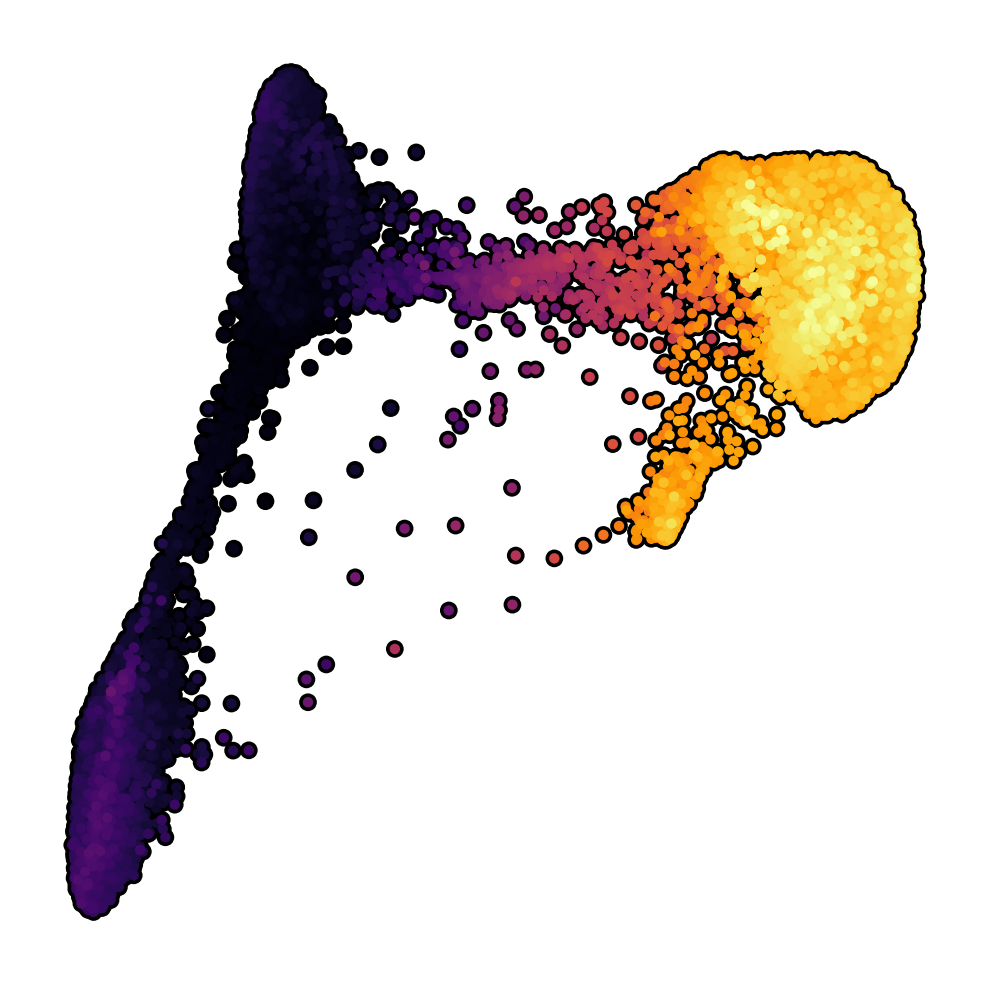

In [6]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

sc.pl.draw_graph(
    adata, 
    color=['mean_velocity_pseudotime'],
    size=25,
    cmap='inferno',
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    outline_color=('k', 'k'),
    title="",
    frameon=False,
    colorbar_loc=None,
    wspace=0.5,
)

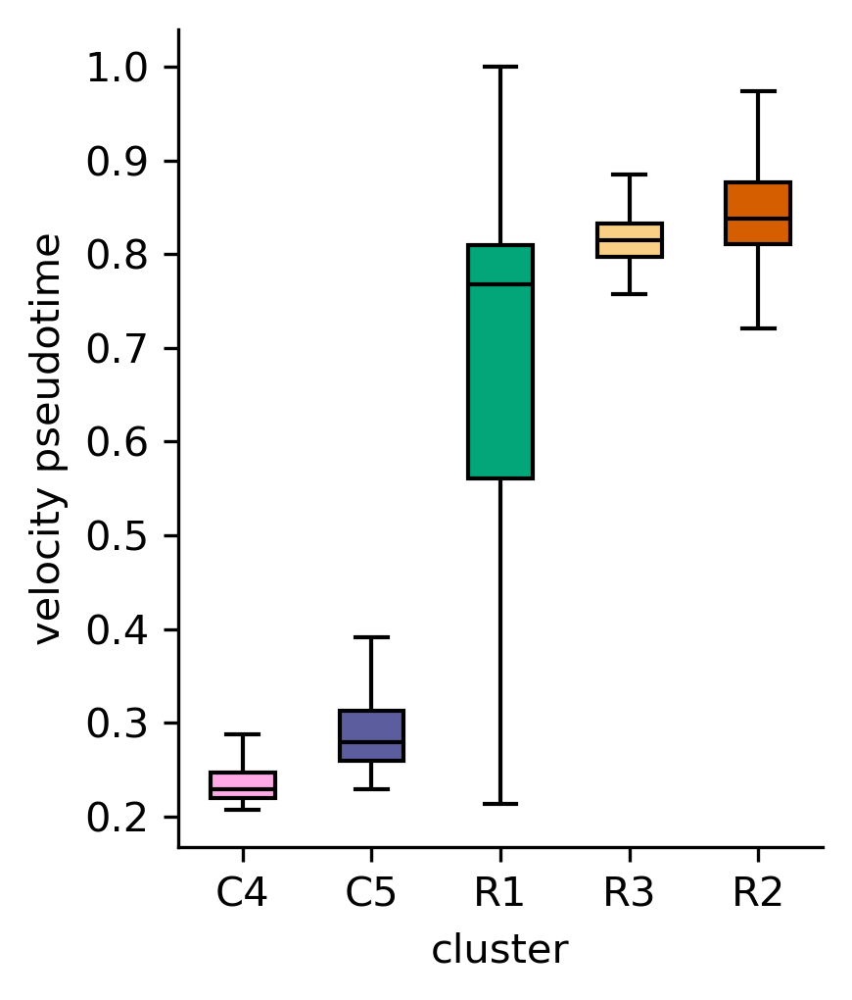

In [6]:
df = pd.DataFrame({
        'pseudotime' : adata.obs['mean_velocity_pseudotime'].values,
        'cell_id': adata.obs_names,
        'cluster' : adata.obs['cluster'].values,
    })

df = df.sort_values(by='pseudotime', ascending=True)
palette = adata.uns['cluster_colors']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3.5

sns.boxplot(
    data=df,
    x='cluster',
    y='pseudotime',
    hue='cluster',
    order=['C4', 'C5', 'R1', 'R3', 'R2'],
    width=0.5,
    linecolor='k',
    showfliers=False,
    palette=palette,
    saturation=1,
)

plt.ylabel("velocity pseudotime")
plt.xlabel("cluster")

sns.despine()
plt.tight_layout()
plt.show()

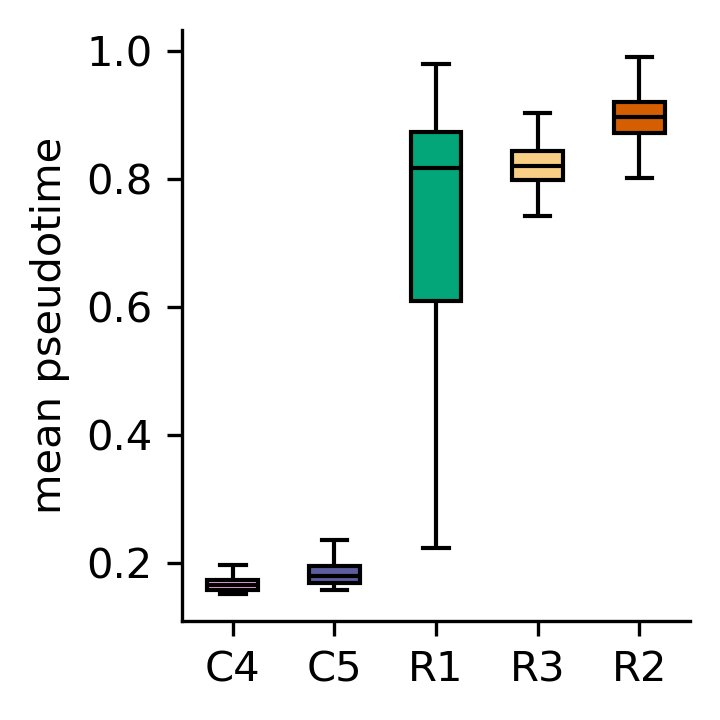

In [12]:
pseudo_col = 'mean_pseudotime'

df = pd.DataFrame({
        'pseudotime' : adata.obs[pseudo_col].values,
        'cell_id': adata.obs_names,
        'cluster' : adata.obs['cluster'].values,
    })

df = df.sort_values(by='pseudotime', ascending=True)
palette = adata.uns['cluster_colors']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 2.5

sns.boxplot(
    data=df,
    x='cluster',
    y='pseudotime',
    hue='cluster',
    order=['C4', 'C5', 'R1', 'R3', 'R2'],
    width=0.5,
    linecolor='k',
    showfliers=False,
    palette=palette,
    saturation=1,
)

plt.ylabel("mean pseudotime")
plt.xlabel("")

sns.despine()
plt.tight_layout()
plt.show()

In [6]:
adata

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'
    var: 'gene_id', 'gene_type', 

In [4]:
# adata.uns['cluster_str_colors_old'] = adata.uns['cluster_str_colors'].copy()

# adata.uns['cluster_str_colors'] = ['#FCAE91', '#FB6A4A', '#CB181D', '#808080', '#808080']

# adata.uns['cluster_str_colors']

['#FCAE91', '#FB6A4A', '#CB181D', '#808080', '#808080']

# Genes over pseudotime

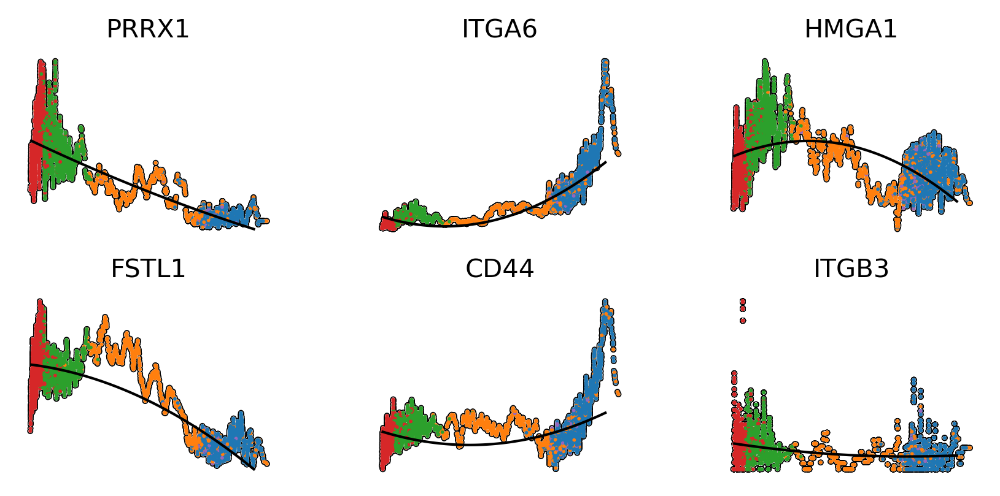

In [43]:
# var_names = ['CD34', 'ACE', 'ITGA6', 'HMGB1', 'CSNK2B', 'MYLK']

# var_names = ['CD34', 'ACE', 'ITGA6', 'HMGB1', 'CSNK2B', 'MYLK', 'LMO2', 'SCL', 'ETV2', 'RUNX1', 'GATA2', 'GFI1', 'SPI1', 'CD44',
            #  'GFI1B', 'TWIST1', 'TWIST2', 'MYB', 'SNAI1', 'SNAI2', 'EZH1', 'EZH2', 'SMAD3', 'RBFOX2',
            # ]

var_names = [
    
#     'PRRX1', 'FSTL1', 'COL1A2',
    
#     # 'DCN', 'PRRX1', 'COL1A2', 'SRF', 'FBNL2', 'LUM', 'FSTL1',
#     'ITGA6', 'ETV2', 'CD44', # EHT-related
    # 'RBFOX2', 'SMAD3', 'HMGB1', # splicing, stemness maintenance, chromatin remodeling
    
    # 'CD34', 'RUNX1', 'TGFB1', 'HMGA1', 'HMGA2', 'IGF2BP2', 'ITGB3', 'SCA1', 'TGFBI', 'ITGAM', 'PROCR',
    
    'PRRX1', 'ITGA6', 'HMGA1',
    'FSTL1', 'CD44', 'ITGB3',
]
    


var_names = [g for g in var_names if g in adata.var_names]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 1.5

scv.pl.scatter(
    adata, 
    x='mean_velocity_pseudotime', 
    y=var_names, 
    add_polyfit=True,
    ncols=3,
    normalize_data=True,
    add_outline=True,
    frameon=False,
    n_convolve=50,
    smooth=True,
    color='cluster_str',
    wspace=0.35,
)

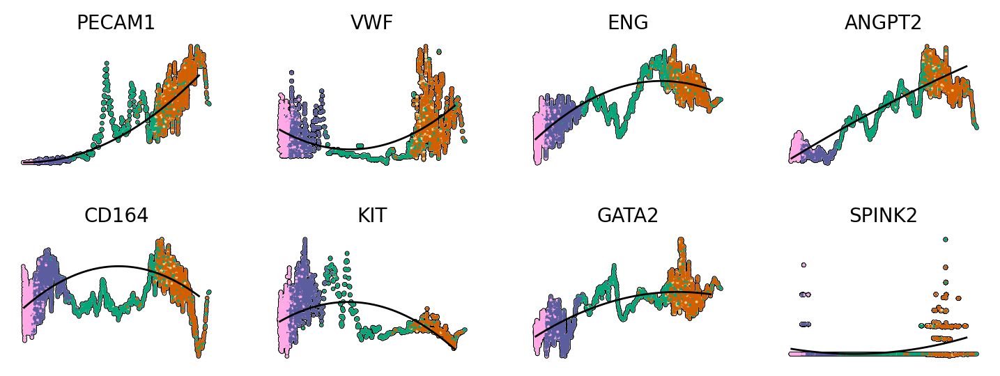

In [10]:
var_names = [
    # 'CD34', 'ACE', 'ITGA6',
    # 'CD44', 
    # 'PCNA', 'PLK1',
    
    # 'MKI67', 'PRRX1', 'ACE', 'CD34', #'MEIS1', #'MSI2',
    # 'TOP2A', 'FSTL1', 'CD44', 'ITGA6', #'PROCR', 
    
    
    # 'ACE', 'CD34', 'PRRX1', 'MKI67',
    # 'CD44', 'ITGA6', 'FSTL1', 'TOP2A',
    # 'RUNX1', 'MSI2', 'MEIS1', 'PROCR',
    
    # 'ACE', 'CD34', 'PRRX1', 
    # 'CD44', 'ITGA6', 'FSTL1',
    # 'RUNX1', 'MSI2', 'DCN',#'MEIS1', 'PROCR',
    
    # 'TOP2A', 'MKI67', 'SOX18',
    
    # 'MEIS1', 'HOPX', 'MECOM', 'BMI1', 'MLLT3', 'PROM1', 'PROCR', 'RUNX1', 'MSI2', 'SPI1', 'SOX17', 'GATA1', 
    # 'CD164', 'HLF', 'IGF2BP1', 'HES1', 'LMO2', 'ZBTB16', #'ERG', 'ESAM', 'RUNX2', 'ZBTB16',
    
    # good velocity
#     'BMI1', 'PROCR', 'MSI2', 'ZBTB16', 'CD164', 'DCN',
    
#     'TOP2A', 'MKI67', 'PLK1',
    # 'RUNX1', 'ACE', 'CD44',
    # 'CD93', 'EMCN', 'PECAM1', 'ENG', 'VWF', 'MECOM',
    # 'CDH5', 'CD62P', 'ANGPT2', 'VCAM1', 'ICAM1', 'ICAM2', 'CD47', 'SELE', 'ESAM',
    # 'NECTIN2', 'ITGB3', 'CD151', 'MCAM', 'ITGA4', #'CD248',
    
    # good endothelial velocity
    'PECAM1', 'VWF', 'ENG', 'ANGPT2', # all going down in spliced counts
    'CD164', 'KIT', 'GATA2', 'SPINK2',
    
]

var_names = [g for g in var_names if g in adata.var_names]

plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 2.25, 1.5

scv.pl.scatter(
    adata, 
    x='mean_velocity_pseudotime', 
    y=var_names, 
    add_polyfit=True,
    ncols=4,
    normalize_data=True,
    add_outline=True,
    frameon=False,
    n_convolve=50,
    smooth=True,
    color='cluster',
    wspace=0.25,
    hspace=0.5,
    layer='velocity',
    # xlabel="velocity pseudotime",
    # ylabel="spliced counts",
    # fontsize=9,
)

In [ ]:
# For supplemental... velocity genes

# Endothelial
# PECAM1, VWF, ENG, ANGPT2,

# EHT
# RUNX1, GATA2

# HSC
# CD164, GATA2, BMI1

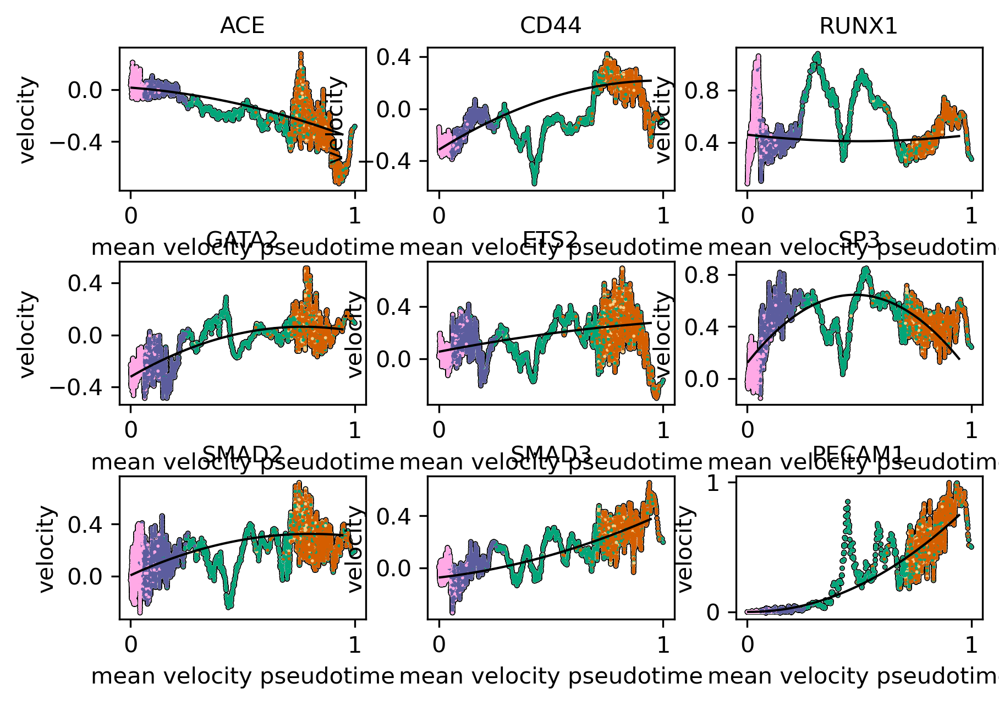

In [79]:
var_names = [
    # EHT good velocity
    'ACE', 'CD44', 'RUNX1', 'GATA2', 'ETS2', 'SP3', 'SMAD2', 'SMAD3', 'PECAM1', 
    
    # HSC good velocity
    # 'PROCR', 'MEIS1', 'CD164', 'PTPRC', 'G0S2', 'IL3RA', 'CSF3R', 'BMI1', 'EPAS1',
]

var_names = [g for g in var_names if g in adata.var_names]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 1.5

scv.pl.scatter(
    adata, 
    x='mean_velocity_pseudotime', 
    y=var_names, 
    add_polyfit=True,
    ncols=3,
    normalize_data=True,
    add_outline=True,
    # frameon=False,
    n_convolve=50,
    smooth=True,
    color='cluster',
    wspace=0.25,
    hspace=0.5,
    layer='velocity',
    # xlabel="velocity pseudotime",
    # ylabel="spliced counts",
    # fontsize=9,
)

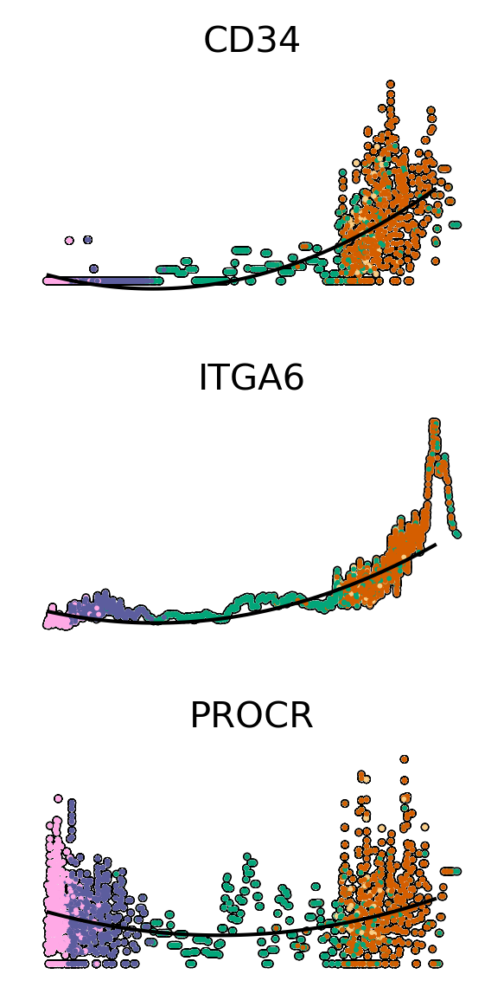

In [67]:
# good examples of switches from spliced to velocity
var_names = [
    # 'ACE', 'CD44', 'RUNX1' # EHT
    # 'PRRX1', 'FSTL1', 'DCN', # fibroblast
    'CD34', 'ITGA6', 'PROCR', # HSC
    # 'MEIS1', 'MSI2', 'ZBTB16',
]

var_names = [g for g in var_names if g in adata.var_names]

layer = 'spliced'

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.25, 1.5

scv.pl.scatter(
    adata, 
    x='mean_velocity_pseudotime', 
    y=var_names, 
    add_polyfit=True,
    ncols=1,
    normalize_data=True,
    add_outline=True,
    frameon=False,
    n_convolve=50,
    smooth=True,
    color='cluster',
    wspace=0.25,
    hspace=0.5,
    layer=layer,
)

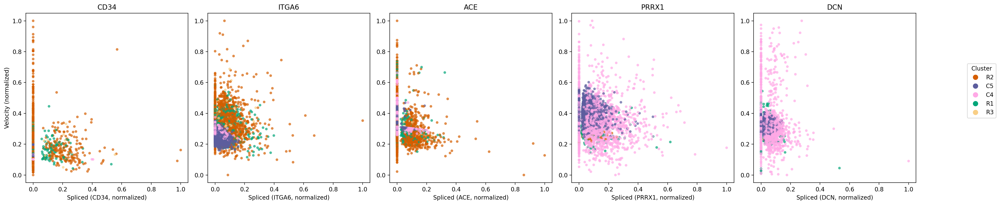

In [54]:
# Example gene list
gene_list = ['CD34', 'ITGA6', 'ACE', 'PRRX1', 'DCN']

gene_indices = [adata.var_names.get_loc(g) for g in gene_list]

spliced = adata.layers['spliced'][:, gene_indices]
if hasattr(spliced, "toarray"):
    spliced = spliced.toarray()
velocity = adata.layers['velocity'][:, gene_indices]
if hasattr(velocity, "toarray"):
    velocity = velocity.toarray()

# Fix cluster-color mapping
clusters = adata.obs['cluster']
if not pd.api.types.is_categorical_dtype(clusters):
    clusters = clusters.astype('category')

categories = clusters.cat.categories
colors = adata.uns['cluster_colors']
color_map = {str(cat): colors[i] for i, cat in enumerate(categories)}
cell_colors = clusters.map(lambda x: color_map[str(x)]).values

n_genes = len(gene_list)
fig, axs = plt.subplots(1, n_genes, figsize=(5*n_genes, 5), sharey=False)

for idx, gene in enumerate(gene_list):
    ax = axs[idx] if n_genes > 1 else axs

    # Normalize spliced and velocity values for this gene
    spliced_gene = spliced[:, idx]
    velocity_gene = velocity[:, idx]
    spliced_norm = (spliced_gene - spliced_gene.min()) / (spliced_gene.max() - spliced_gene.min() + 1e-12)
    velocity_norm = (velocity_gene - velocity_gene.min()) / (velocity_gene.max() - velocity_gene.min() + 1e-12)

    ax.scatter(
        spliced_norm,
        velocity_norm,
        c=cell_colors,
        s=20,
        alpha=0.7,
        edgecolor="none"
    )
    ax.set_xlabel(f"Spliced ({gene}, normalized)")
    if idx == 0:
        ax.set_ylabel("Velocity (normalized)")
    ax.set_title(f"{gene}")
    ax.set_xlim(-0.05,1.05)
    ax.set_ylim(-0.05,1.05)

# Make one legend for the entire figure
handles = [
    plt.Line2D([0], [0], marker='o', color='w', label=clu,
               markerfacecolor=color_map[clu], markersize=10)
    for clu in cluster_labels
]
fig.legend(handles, cluster_labels, title='Cluster', bbox_to_anchor=(0.92, 0.7), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.88, 1])

plt.show()

In [31]:
var_names

['MEIS1',
 'HOPX',
 'MECOM',
 'BMI1',
 'MLLT3',
 'PROCR',
 'RUNX1',
 'MSI2',
 'CD164',
 'CD164',
 'IGF2BP1',
 'HES1',
 'LMO2',
 'ZBTB16']

In [25]:
tmp = adata.var.copy()
tmp = tmp.reset_index(names='gene')
print(tmp['gene'].nunique())
tmp.head()

23434


,gene,gene_id,gene_type,Chromosome,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,...,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes,spearmans_score,velocity_score
0,A1BG,ENSG00000121410,protein_coding,chr19,False,False,False,10687,1.192232,0.784920,...,NaN,NaN,NaN,NaN,0.519080,0.519080,-0.328817,False,0.070586,0
1,A1BG-AS1,ENSG00000268895,lncRNA,chr19,False,False,False,1140,0.060542,0.058780,...,NaN,NaN,NaN,NaN,0.420073,0.420073,-0.336414,False,0.110313,0
2,A2M,ENSG00000175899,protein_coding,chr12,False,False,False,1072,0.081557,0.078402,...,NaN,NaN,NaN,NaN,0.117400,0.117400,-0.059507,False,0.051233,0
3,A2M-AS1,ENSG00000245105,lncRNA,chr12,False,False,False,64,0.003339,0.003333,...,NaN,NaN,NaN,NaN,0.006579,0.006579,-0.025046,False,0.000000,0
4,A2ML1,ENSG00000166535,protein_coding,chr12,False,False,False,78,0.003879,0.003872,...,NaN,NaN,NaN,NaN,0.000000,0.000000,-0.011411,False,NaN,0


In [26]:
tmp[tmp['gene'] == 'ZBTB16']

,gene,gene_id,gene_type,Chromosome,mt,ribo,hb,n_cells_by_counts,mean_counts,log1p_mean_counts,...,fit_steady_u,fit_steady_s,fit_variance,fit_alignment_scaling,velocity_gamma,velocity_qreg_ratio,velocity_r2,velocity_genes,spearmans_score,velocity_score
22603,ZBTB16,ENSG00000109906,protein_coding,chr11,False,False,False,4315,0.490474,0.399094,...,NaN,NaN,NaN,NaN,0.818556,0.818556,0.734375,False,0.938608,0


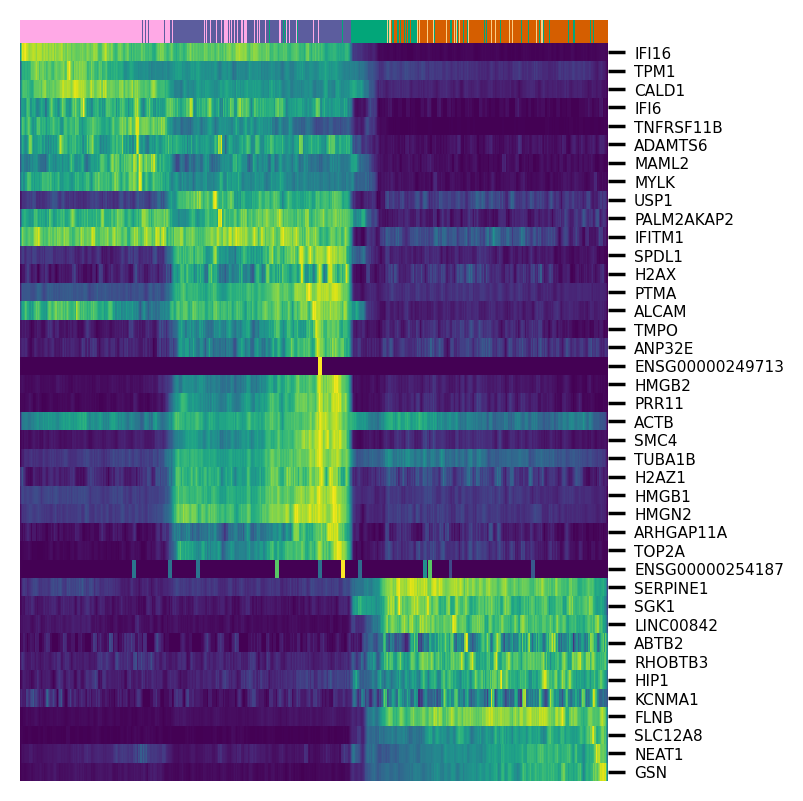

In [32]:
n_genes = 40

df = adata.var.copy()

top_n = df.nlargest(n_genes, 'fit_likelihood')

plt.rcParams['figure.dpi'] = 200

scv.pl.heatmap(
    adata, 
    var_names=top_n.head(n_genes).index, 
    sortby='mean_velocity_pseudotime', 
    col_color='cluster', 
    figsize=(4, 4),
    yticklabels=True,
    n_convolve=100,
    layer='spliced',
    font_scale=0.5,
    standard_scale=0,
)

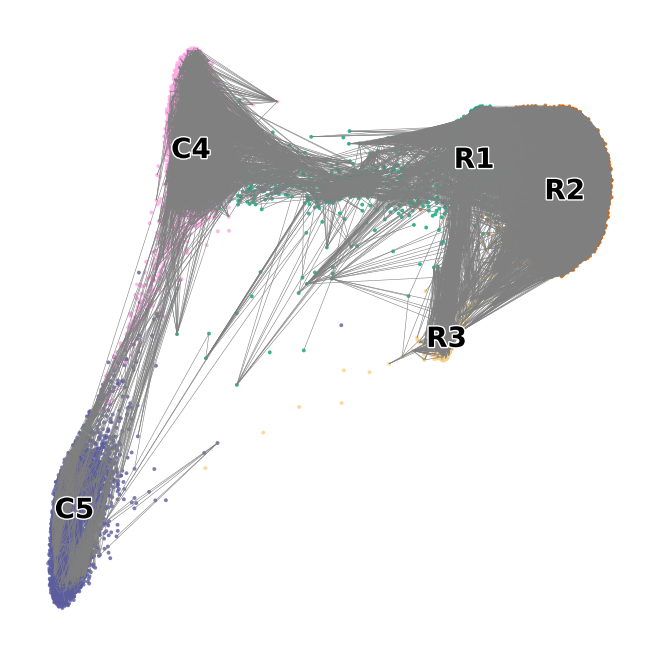

In [38]:
plt.rcParams['figure.dpi'] = 200
plt.rcParams['figure.figsize'] = 4, 4

scv.pl.velocity_graph(
    adata, 
    # density=(3, 3),
    basis='X_draw_graph_fa',
    color='cluster',
    vkey='velocity',
    which_graph='velocity_graph',
    threshold=0.3,
    edges_on_top=True,
    # smooth=True,
    title="",
    # legend_loc='none',
    # legend_loc='right_margin',
    # linewidth=0.75,
    # arrow_size=1,
    # add_margin=0.1,
)

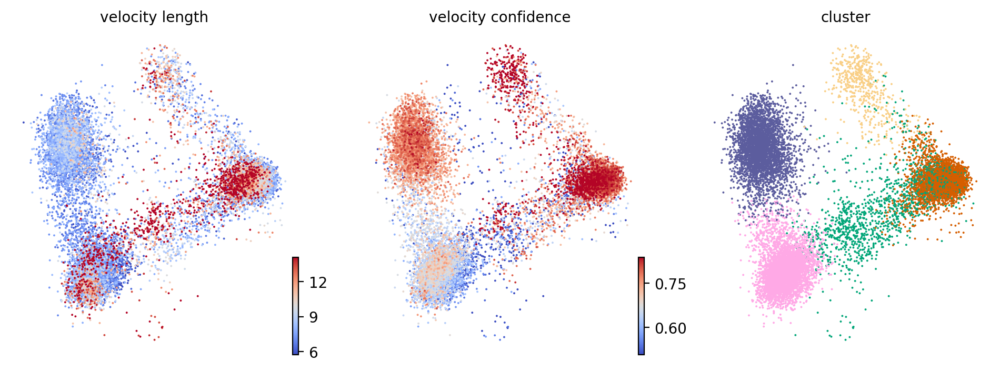

In [41]:
# scv.tl.velocity_confidence(adata)
keys = 'velocity_length', 'velocity_confidence', 'cluster'
scv.pl.scatter(adata, c=keys, cmap='coolwarm', perc=[5, 95])

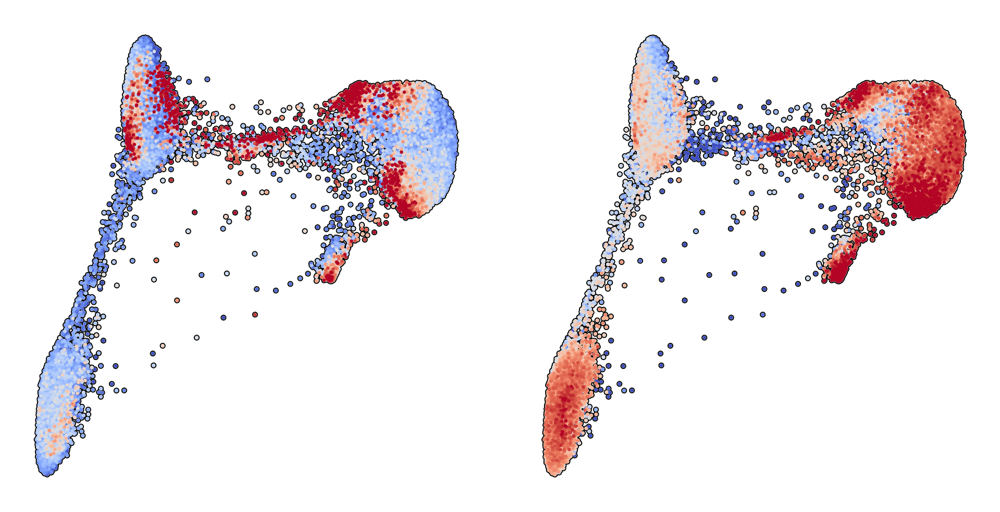

In [78]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 4, 4

keys = 'velocity_length', 'velocity_confidence',
scv.pl.scatter(
    adata,
    c=keys,
    cmap='coolwarm',
    basis='X_draw_graph_fa',
    perc=[5, 95],
    size=10,
    add_outline=True,
    title="",
    wspace=0.1,
    # smooth=20,
    normalize_data=True,
    # color_map='autumn',
    rescale_color=[0, 1],
    colorbar=False,
    
    # outline_color=
)

In [44]:
adata

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime', 'cluster', 'velocity_length', 'v

# Correlation

355


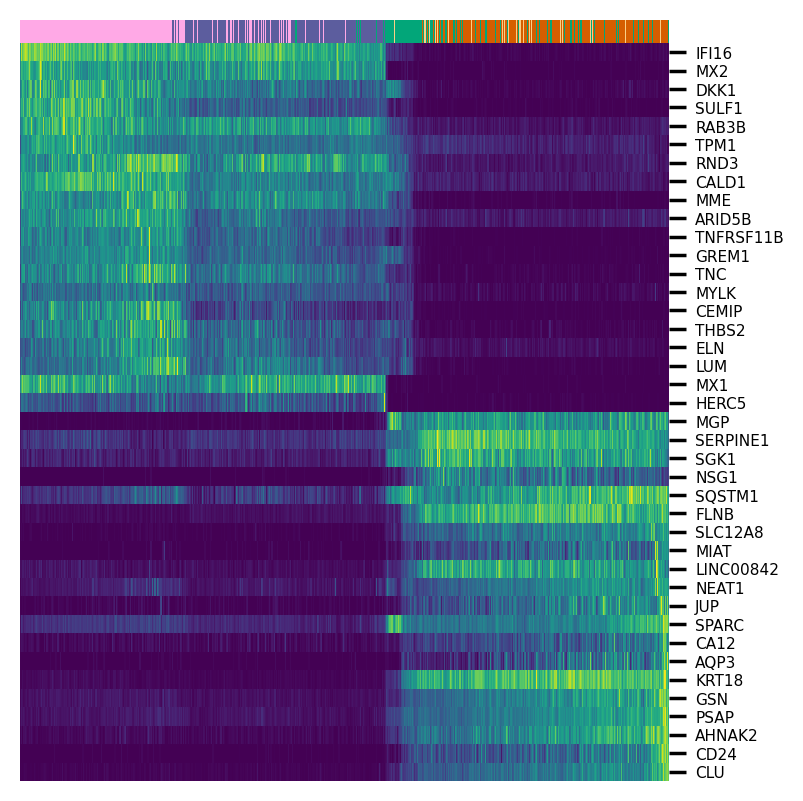

In [14]:
fit_thresh = 0.3
velo_thresh = 0.1

mask = (
    (adata.var['velocity_genes']) &
    (adata.var['fit_r2'] > fit_thresh) &
    (adata.var['velocity_r2'] > velo_thresh)
)

layer = 'spliced'

pt = adata.obs['mean_velocity_pseudotime']
X = adata[:, mask].layers[layer].toarray()

cors = np.array([
    spearmanr(X[:, i], pt)[0]
    for i in range(X.shape[1])
])

gene_names = adata.var_names[mask]
cors = pd.Series(cors, index=gene_names)
print(len(cors))

top_pos = cors.sort_values(ascending=False).head(20).index
top_neg = cors.sort_values().head(20).index

selected_genes = list(top_pos) + list(top_neg)



scv.pl.heatmap(
    adata, 
    var_names=selected_genes, 
    sortby='mean_velocity_pseudotime', 
    col_color='cluster', 
    figsize=(4, 4),
    yticklabels=True,
    # n_convolve=100,
    layer=layer,
    font_scale=0.5,
    # standard_scale=0,
)

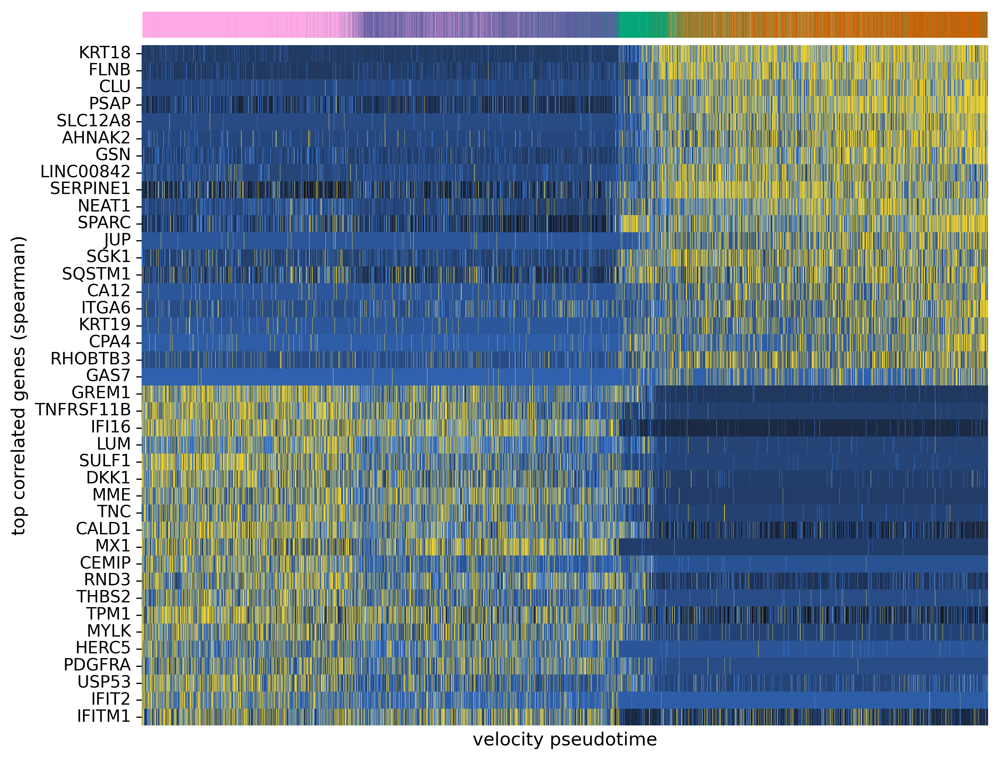

In [43]:
from matplotlib import gridspec
from matplotlib.colors import to_rgba
from matplotlib.colors import LinearSegmentedColormap

low = '#131317' # dark
mid = '#3B80EB' # blue
high = '#F2D123' # yellow

custom_cmap = LinearSegmentedColormap.from_list(
    "custom_cmap",
    [(0.0, low), (0.15, low), (0.5, mid), (0.85, high), (1.0, high)]
)

cell_order = adata.obs.sort_values("mean_velocity_pseudotime").index
n_cells = len(cell_order)

adata.X = adata.layers['spliced'].copy()

expr = adata[cell_order, selected_genes].X
if not isinstance(expr, np.ndarray):
    expr = expr.toarray()

# z-score expression
expr_z = zscore(expr, axis=0)

# get bar for cluster order
clusters = adata.obs.loc[cell_order, 'cluster']

# mapping: category → color
cluster_colors = dict(zip(
    adata.obs['cluster'].cat.categories,
    adata.uns['cluster_colors']
))

# convert cluster labels to colors for each cell in order
col_colors = clusters.map(cluster_colors).to_numpy()
rgba_colors = np.array([to_rgba(c) for c in col_colors])


fig = plt.figure(figsize=(10, 8.5), dpi=300)

gs = gridspec.GridSpec(
    2, 1, 
    height_ratios=[0.4, 10],   # small top bar, big heatmap
    hspace=0.02                 # small spacing
)

# --- Top colorbar axis (tiny horizontal strip) ---
ax_color = fig.add_subplot(gs[0])

ax_color.imshow(rgba_colors[np.newaxis, :, :], aspect='auto')
ax_color.set_xlim(0, n_cells)
ax_color.set_xticks([])
ax_color.set_yticks([])
for spine in ax_color.spines.values():
    spine.set_edgecolor('white')

ax_heat = fig.add_subplot(gs[1])

sns.heatmap(
    expr_z.T,
    cmap=custom_cmap,
    xticklabels=False,
    yticklabels=selected_genes,
    vmin=-1.5,
    vmax=1.5,
    cbar=False,
    ax=ax_heat,
)
ax_heat.set_yticklabels(ax_heat.get_yticklabels(), fontsize=11)
ax_heat.set_xlabel("velocity pseudotime", fontsize=12)
ax_heat.set_ylabel("top correlated genes (spearman)", fontsize=12)

plt.tight_layout()
plt.show()

In [87]:
top_neg = cors.sort_values().head(50).index
top_neg

Index(['GREM1', 'TNFRSF11B', 'IFI16', 'LUM', 'SULF1', 'DKK1', 'MME', 'TNC',
       'CALD1', 'MX1', 'CEMIP', 'RND3', 'THBS2', 'TPM1', 'MYLK', 'HERC5',
       'PDGFRA', 'USP53', 'IFIT2', 'IFITM1', 'PTN', 'EFEMP1', 'PALM2AKAP2',
       'DCN', 'MAML2', 'LPAR1', 'SEMA5A', 'COL8A1', 'PRRX1', 'IFI6', 'NRP1',
       'WNT5A', 'ADAMTS6', 'MMP3', 'FBN2', 'ENPP2', 'MMP1', 'EPSTI1', 'TPM2',
       'ALDH1A1', 'RUNX1T1', 'KIF26B', 'PTMA', 'EXT1', 'REV3L', 'DSP', 'FN1',
       'LIMCH1', 'SEMA3C', 'BICC1'],
      dtype='object')

In [89]:
top_pos = cors.sort_values(ascending=False).head(100).index
top_pos

Index(['KRT18', 'FLNB', 'CLU', 'PSAP', 'SLC12A8', 'AHNAK2', 'GSN', 'LINC00842',
       'SERPINE1', 'NEAT1', 'SPARC', 'JUP', 'SGK1', 'SQSTM1', 'CA12', 'ITGA6',
       'KRT19', 'CPA4', 'RHOBTB3', 'GAS7', 'SCARA5', 'DPYSL3', 'HIP1', 'GFPT2',
       'LINC00839', 'NDRG4', 'UBASH3B', 'NEBL', 'PLAT', 'KANK4', 'IRAK3',
       'MATN2', 'CCN4', 'HEG1', 'MAPT', 'DAAM1', 'PLXNA4', 'IGFL2-AS1', 'ANO1',
       'MAGI1', 'MAP2', 'CHAT', 'UNC5C', 'CTPS1', 'ODAPH', 'MYPN', 'ANKRD1',
       'PKP2', 'LYPD6B', 'AURKA', 'CIT', 'PRC1', 'CENPE', 'CDC25C', 'HJURP',
       'KIF18B', 'ADGRD1', 'GAS2L3', 'DLGAP5', 'ASPM', 'ANP32E', 'CDCA8',
       'RRM2', 'PBK', 'BUB1B', 'KNL1', 'KIF18A', 'KIF15', 'KIF14', 'NUSAP1',
       'ARHGAP11A', 'CCNA2', 'RFC3', 'MKI67', 'CDCA2', 'PCLAF', 'NSD2',
       'H2AZ1', 'H2AX', 'TRIP13', 'DIAPH3', 'PLCB4', 'DBF4', 'TOP2A', 'FANCI',
       'TMPO', 'KIF23', 'SGO2', 'KIFC1', 'CLSPN', 'TNFSF10', 'GTSE1', 'BUB3',
       'CENPF', 'KCNQ5', 'SLC38A11', 'GBP4', 'CEP55', 'PRR11', 'SMC4'],
 

In [92]:
cors.head()

ACKR4     -0.208331
ACTG1     -0.129107
ADAMTS6   -0.359917
ADGRD1    -0.006264
AFF3      -0.209990
dtype: float64

In [45]:
import gget

# enrichr

In [91]:
n_genes = 50

top_pos = cors.sort_values(ascending=False).head(n_genes).index
top_neg = cors.sort_values().head(n_genes).index

# pd.set_option('display.max_colwidth', None)

# database = 'celltypes'
database = "GO_Biological_Process_2025"
# database="KEGG_2021_Human"
# database='MSigDB_Hallmark_2020' 
# database="Reactome_Pathways_2024"
# database = "CellMarker_2024"
# database='Tabula_Sapiens'


edf_pos = gget.enrichr(top_pos, database=database, save=False)
display(edf_pos[['path_name', 'overlapping_genes', 'adj_p_val']].head(15))
print("=" * 100 + "\n")

edf_neg = gget.enrichr(top_neg, database=database, save=False)
display(edf_neg[['path_name', 'overlapping_genes', 'adj_p_val']].head(15))
print("=" * 100 + "\n")

18:16:39 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


,path_name,overlapping_genes,adj_p_val
0,Regulation of Cellular Component Organization (GO:0051128),"[MAGI1, SPARC, HIP1, IRAK3, SGK1, AURKA]",0.001867
1,Regulation of Smooth Muscle Cell Migration (GO:0014910),"[NDRG4, SERPINE1, CCN4]",0.004730
2,Bundle of His cell-Purkinje Myocyte Adhesion Involved in Cell Communication (GO:0086073),"[JUP, PKP2]",0.008907
3,Sarcomere Organization (GO:0045214),"[KRT19, ANKRD1, MYPN]",0.008907
4,Negative Regulation of Plasminogen Activation (GO:0010757),"[SERPINE1, PLAT]",0.008907
5,Cardiac Muscle Cell-Cardiac Muscle Cell Adhesion (GO:0086042),"[JUP, PKP2]",0.008907
6,Desmosome Assembly (GO:0002159),"[JUP, PKP2]",0.008907
7,Regulation of Receptor-Mediated Endocytosis (GO:0048259),"[HIP1, SERPINE1, CLU]",0.011602
8,Positive Regulation of Receptor-Mediated Endocytosis (GO:0048260),"[HIP1, SERPINE1, CLU]",0.011602
9,Bundle of His Cell to Purkinje Myocyte Communication (GO:0086069),"[JUP, PKP2]",0.011602


18:16:39 - INFO - Performing Enrichr analysis using database GO_Biological_Process_2025.


,path_name,overlapping_genes,adj_p_val
0,Regulation of Cell Migration (GO:0030334),"[SEMA5A, FBN2, PDGFRA, CEMIP, IFITM1, SEMA3C, LIMCH1, TPM1, ENPP2, PTN, SULF1, MYLK]",0.000001
1,Positive Regulation of Cell Migration (GO:0030335),"[SEMA5A, PDGFRA, NRP1, CEMIP, SEMA3C, WNT5A, ENPP2, FN1, MYLK]",0.000057
2,Neural Crest Cell Migration (GO:0001755),"[SEMA5A, NRP1, SEMA3C, FN1]",0.000404
3,Positive Regulation of Stress Fiber Assembly (GO:0051496),"[NRP1, LIMCH1, TPM1, LPAR1]",0.000703
4,Positive Regulation of Chemotaxis (GO:0050921),"[SEMA5A, NRP1, PDGFRA, PTN]",0.000704
5,Extracellular Matrix Organization (GO:0030198),"[GREM1, LUM, MMP1, MMP3, COL8A1, ADAMTS6]",0.000704
6,Positive Regulation of Actin Filament Bundle Assembly (GO:0032233),"[NRP1, LIMCH1, TPM1, LPAR1]",0.000802
7,Regulation of Stress Fiber Assembly (GO:0051492),"[NRP1, LIMCH1, TPM1, LPAR1]",0.003266
8,Positive Regulation of Fibroblast Proliferation (GO:0048146),"[PDGFRA, WNT5A, FN1]",0.003631
9,Regulation of Axon Extension Involved in Axon Guidance (GO:0048841),"[SEMA5A, NRP1]",0.003765


In [48]:
import re

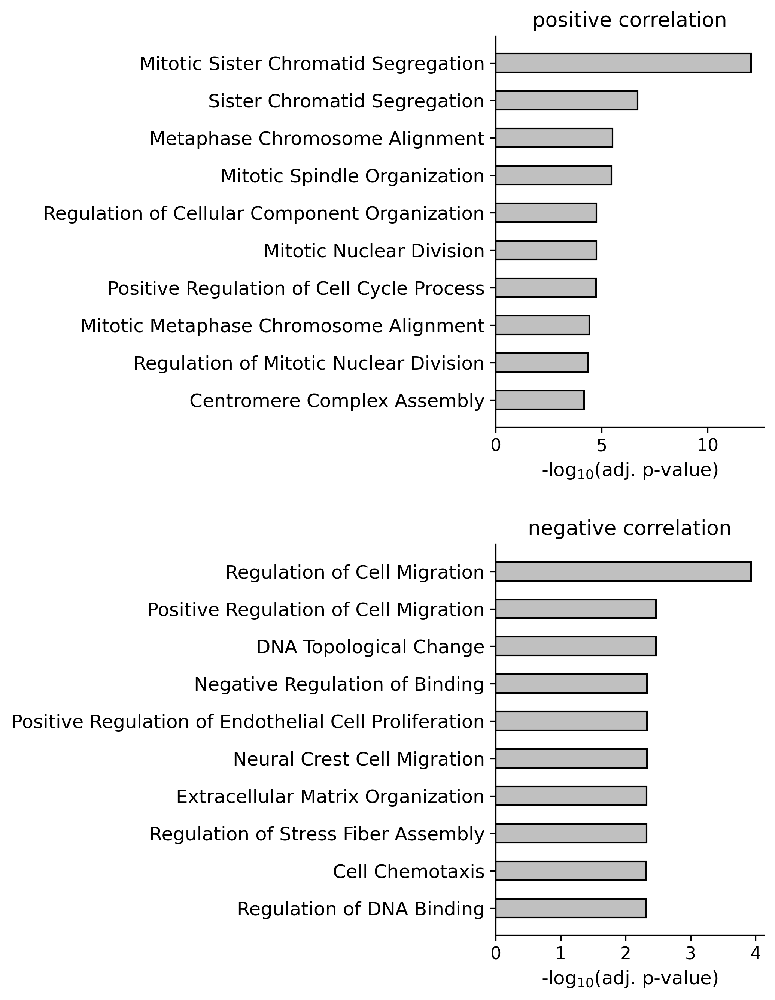

In [80]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 7, 9 #15, 4
fig, axes = plt.subplots(2, 1)
axes = axes.flatten()

n_terms = 10

groups = ['positive correlation', 'negative correlation']

for i, group in enumerate(groups):
    
    if group == 'positive correlation':
        tmp = edf_pos.copy()
    else:
        tmp = edf_neg.copy()
        
    top_terms = tmp[['path_name', 'adj_p_val', 'overlapping_genes']].head(n_terms).copy()

    # Remove IDs in parentheses from path names
    top_terms['path_name'] = top_terms['path_name'].apply(lambda x: re.sub(r"\s*\(.*\)", "", x))
    top_terms['neglog10_p'] = -np.log10(top_terms['adj_p_val'])

    colors = ["silver" if p <= 0.05 else "lemonchiffon" for p in top_terms['adj_p_val']]

    ax = axes[i]
    ax.barh(
        top_terms['path_name'][::-1],
        top_terms['neglog10_p'][::-1],
        color=colors[::-1],
        height=0.5,
        edgecolor='k',
        linewidth=1,
    )

    ax.set_title(f"{group}", fontsize=13)
    ax.set_xlabel("-log$_{10}$(adj. p-value)", fontsize=12)
    ax.set_ylabel("")  
    ax.tick_params(axis='x', labelsize=11)
    ax.tick_params(axis='y', labelsize=12)

sns.despine()
plt.tight_layout()
plt.subplots_adjust(hspace=0.3)
plt.show()

In [13]:
adata

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime', 'cluster'
    var: 'gene_id', 'g

Spearman ρ = 0.90, p = 0.00e+00


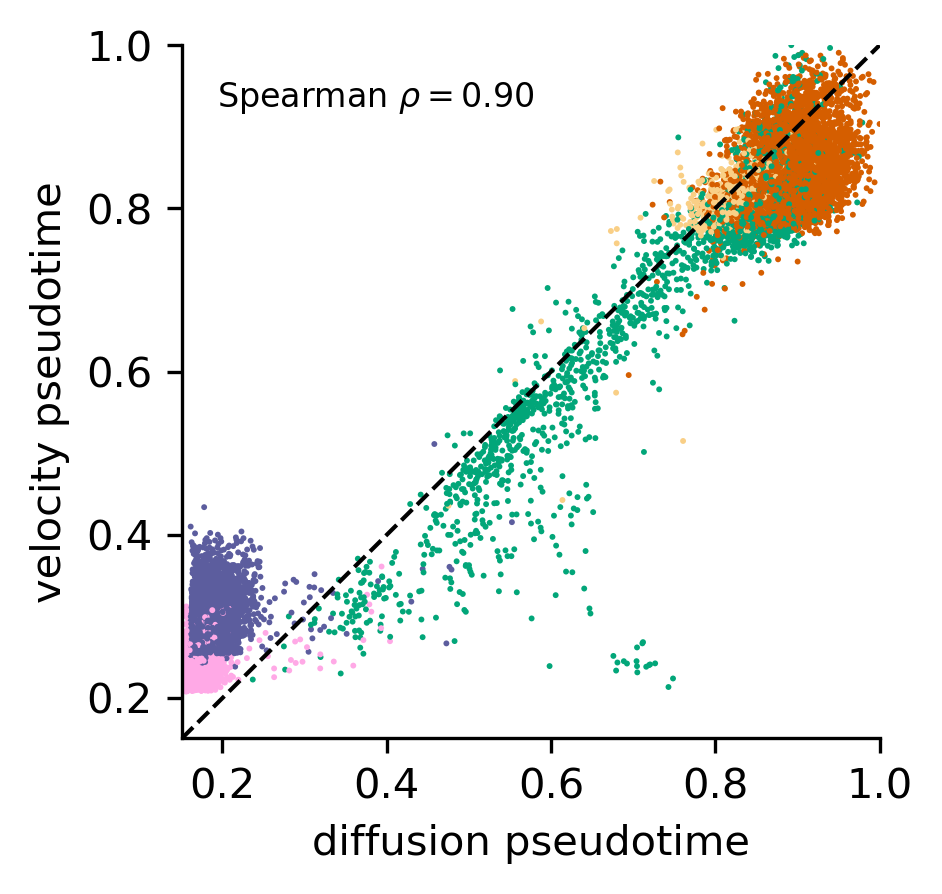

In [9]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

palette = adata.uns['cluster_colors']

sns.scatterplot(
    data=adata.obs,
    x='mean_pseudotime',
    y='mean_velocity_pseudotime',
    hue='cluster',
    palette=palette,
    edgecolor='none',
    s=2,
    legend=False,
    linewidth=0
)

# # Fit linear model
# x = adata.obs['mean_pseudotime']
# y = adata.obs['mean_velocity_pseudotime']
# slope, intercept, r_value, p_value, std_err = linregress(x, y)

# print("p < 1e-300" if p_value == 0 else f"p = {p_value:.2e}")


# # Plot regression line
# x_vals = np.linspace(x.min(), x.max(), 100)
# plt.plot(x_vals, intercept + slope * x_vals, color='black', linewidth=1)

# # Annotate R²
# plt.text(0.05, 0.95, f"$R^2 = {r_value**2:.2f}$", transform=plt.gca().transAxes,
#          ha='left', va='top', fontsize=8,
#          bbox=dict(facecolor='white', edgecolor='none', alpha=0.8))

from scipy.stats import spearmanr

rho, p = spearmanr(
    adata.obs['mean_pseudotime'],
    adata.obs['mean_velocity_pseudotime']
)

print(f"Spearman ρ = {rho:.2f}, p = {p:.2e}")


plt.text(
    0.05, 0.95,
    f"Spearman $\\rho = {rho:.2f}$",
    transform=plt.gca().transAxes,
    ha='left', va='top', fontsize=8,
    bbox=dict(facecolor='white', edgecolor='none', alpha=0.8)
)

# identity line
lims = [
    min(x.min(), y.min()),
    max(x.max(), y.max())
]

plt.plot(lims, lims, '--', color='black', linewidth=1)
plt.xlim(lims)
plt.ylim(lims)

# Label axes
plt.xlabel("diffusion pseudotime")
plt.ylabel("velocity pseudotime")

# Remove top and right spines for cleaner visualization
sns.despine()

In [8]:
from scipy.stats import spearmanr

rho, p = spearmanr(
    adata.obs['mean_pseudotime'],
    adata.obs['mean_velocity_pseudotime']
)

print(f"Spearman ρ = {rho:.2f}, p = {p:.2e}")

Spearman ρ = 0.90, p = 0.00e+00


# Write out

In [23]:
# outpath = "/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/new_scvelo.h5ad"

# adata.write(outpath)
# adata

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime'
    var: 'gene_id', 'gene_type', 

# Rank velocity genes

In [5]:
scv.tl.rank_velocity_genes(adata, groupby='cluster', min_corr=.3)

df = pd.DataFrame(adata.uns['rank_velocity_genes']['names'])
print(df.head(25).to_string())

ranking velocity genes
    finished (0:01:33) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)
           C4       C5         R1         R2        R3
0        BDNF    STMN1   SERPINE2      MAGI1     KIF4A
1       GRIA3   SLC8A1      CLIC4     KCNMA1      TPX2
2       SVEP1   KIF18B       RND3      ABTB2    KIF20B
3   LINC00968    SLIT2       ENO1      MORC3     NDC80
4      PDZRN3      JUN        CLU    TRABD2B       NXN
5      KIF26B  ADAMTS6      NEAT1     CHAF1B     GPSM2
6       SSBP2    BRIP1        MGP      NEAT1     CIP2A
7       WNT5A    CIP2A      KRT19  IGFL2-AS1      NUF2
8        AFF3     RFC3       BTG2     PRSS23     TACC3
9       CDCA2    MAML2      SPARC      IL1R1     CENPF
10       FMN2   TRIM59       NSG1    UBASH3B      G2E3
11      TRPS1    PRRX1     CRABP2   SERPINE1       CIT
12      GREM2    NLGN1    GRAMD2B      SMAD6     CKAP2
13      KCNK2    MKI67       RBP1       NE

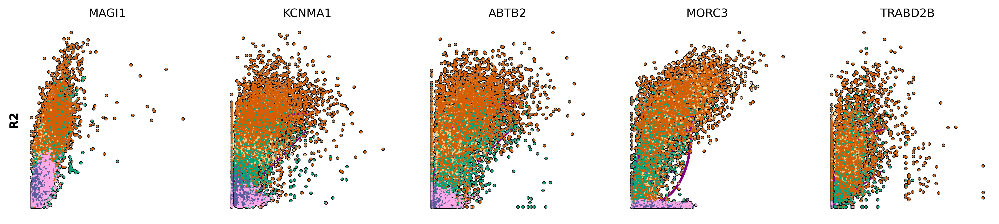

In [6]:
## endothelial / ecm / good ones from top velocity
# SPARC, CLU, MGP, MAGI1, HEG1, SMAD6, ENO1, WNT9A

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

kwargs = dict(color='cluster', frameon=False, size=10, linewidth=1.5, smooth=True,
              add_outline='R1, R2, R3, C4, C5')

scv.pl.scatter(
    adata,
    df['R2'][:5],
    ylabel='R2',
    **kwargs,
)
# scv.pl.scatter(
#     adata,
#     df['C5'][:5],
#     ylabel='C5',
#     **kwargs,
# )

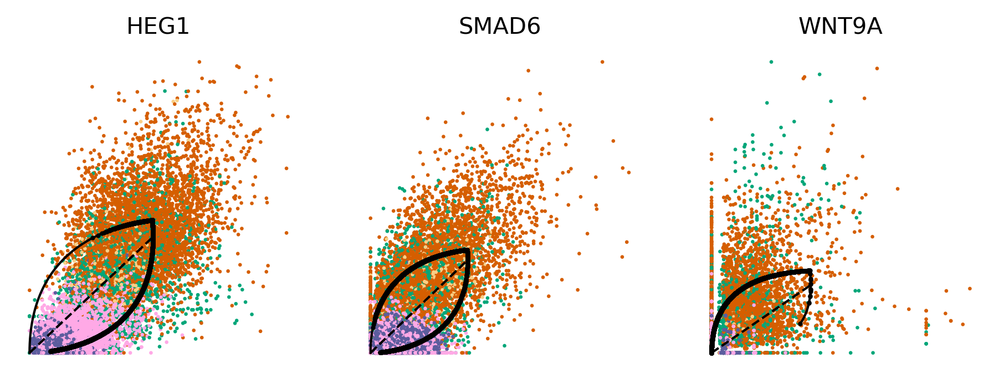

In [54]:
# genes_to_plot = ['HEG1', 'MAGI1', 'SMAD6', 'WNT9A']
genes_to_plot = ['HEG1', 'SMAD6', 'WNT9A']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.5, 2.5

kwargs = dict(color='cluster', frameon=False, size=10, linewidth=1, smooth=True, linecolor='k')#, normalize_data=True)#, add_outline='R2')#, alpha=0.9, add_outline='R2')
              # add_outline='R1, R2, R3, C4, C5')

scv.pl.scatter(
    adata,
    genes_to_plot,
    # ylabel='R2',
    **kwargs,
)

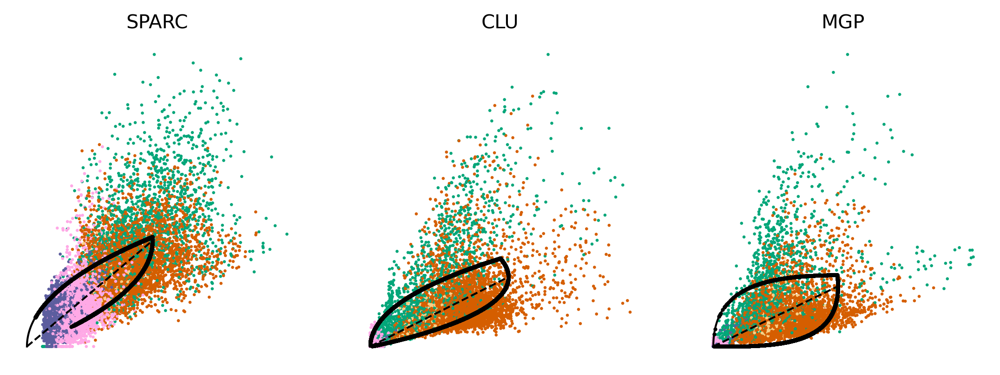

In [53]:
# genes_to_plot = ['ENO1', 'SPARC', 'CLU', 'MGP']

genes_to_plot = ['SPARC', 'CLU', 'MGP']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

kwargs = dict(color='cluster', frameon=False, size=10, linewidth=1, smooth=True, linecolor='k')#, normalize_data=True)#, alpha=0.9, add_outline='R1')
              # add_outline='R1, R2, R3, C4, C5')

scv.pl.scatter(
    adata,
    genes_to_plot,
    # ylabel='R1',
    **kwargs,
)


# x = spliced, y = unspliced. Purple line = learned dynamics

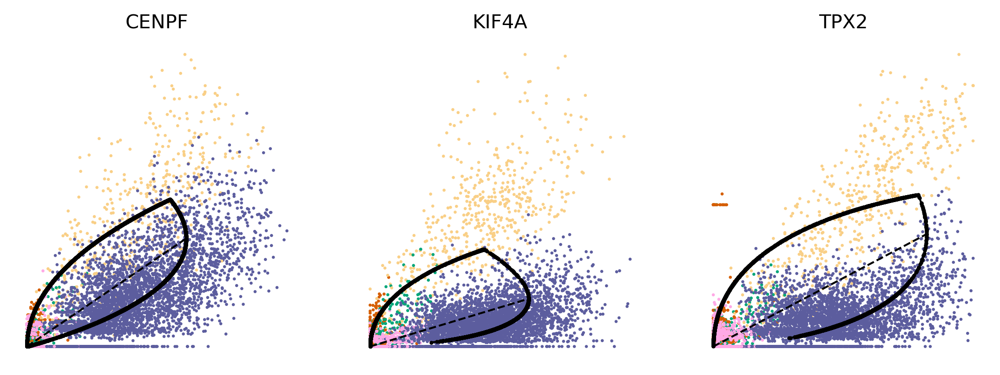

In [55]:
genes_to_plot = ['CENPF', 'KIF4A', 'TPX2']

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

kwargs = dict(color='cluster', frameon=False, size=10, linewidth=1, smooth=True, linecolor='k')#, normalize_data=True)#, alpha=0.6, add_outline='R3')#'R1, R2, R3, C4, C5')

scv.pl.scatter(
    adata,
    genes_to_plot,
    # ylabel='R2',
    **kwargs,
)

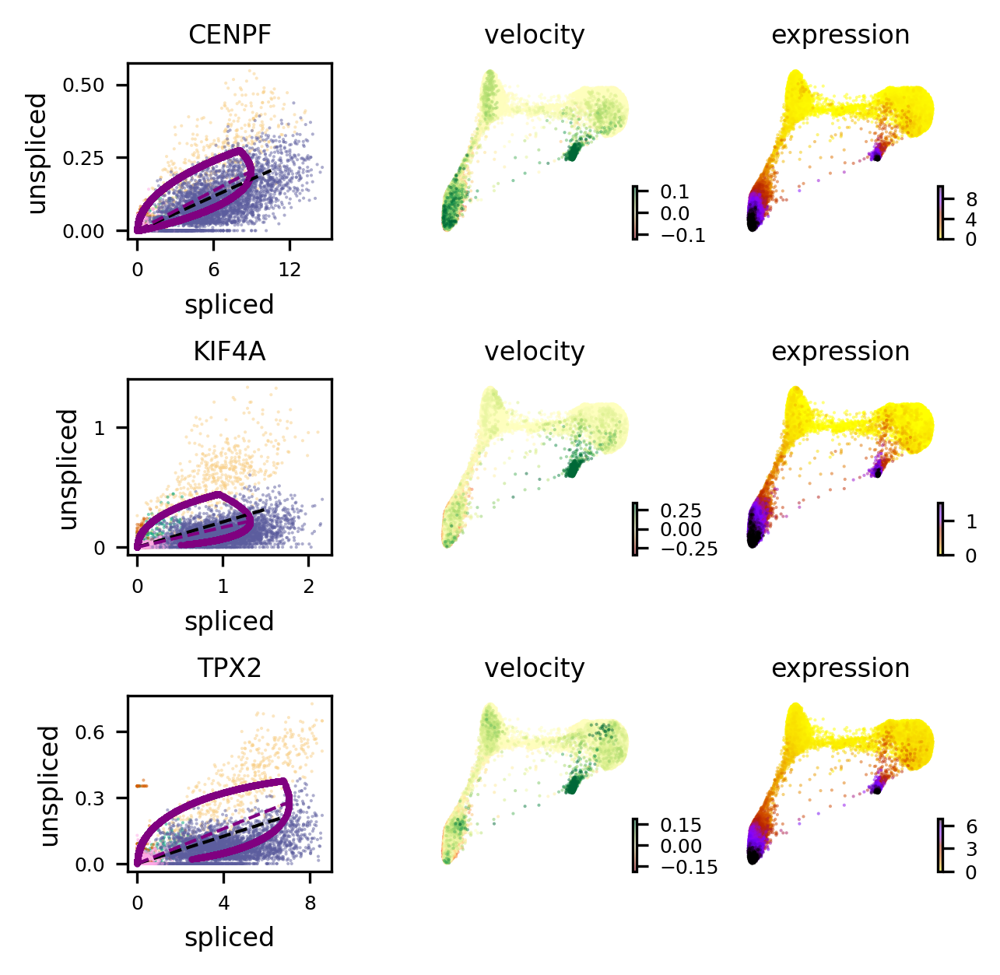

In [56]:
plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 3, 3

scv.pl.velocity(
    adata,
    genes_to_plot,
    basis='X_draw_graph_fa',
    color='cluster',
)

In [ ]:
adata

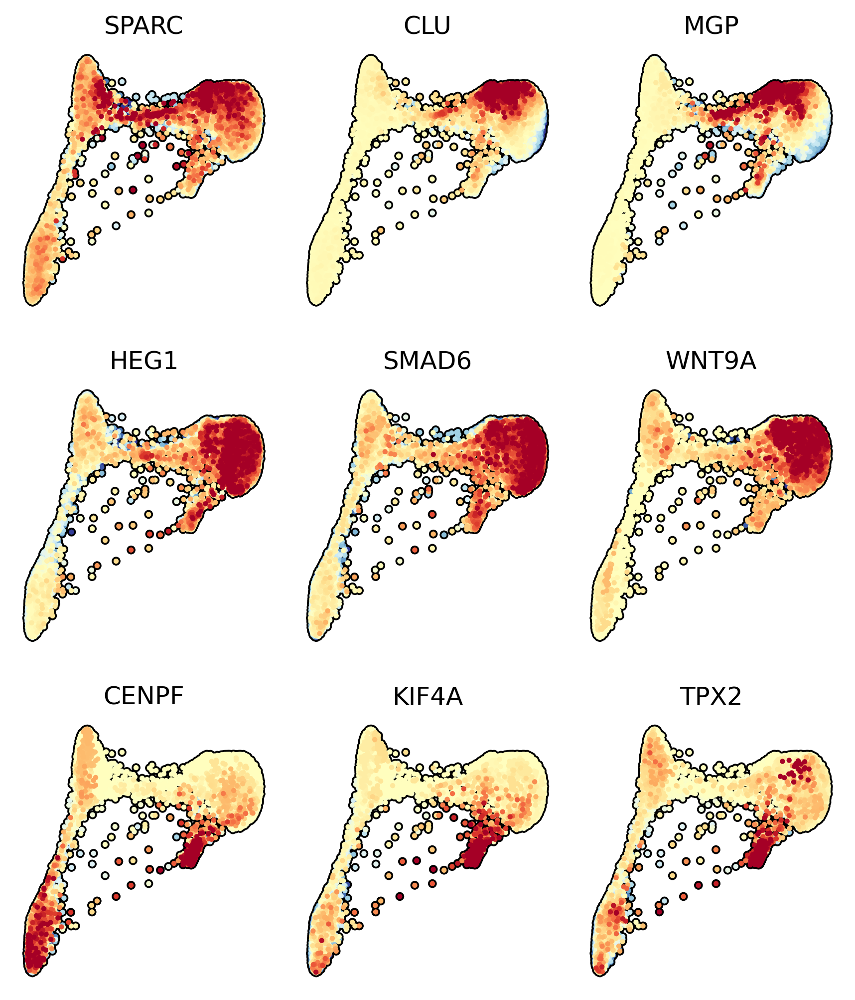

In [13]:
# genes_to_plot = ['CENPF', 'KIF4A', 'TPX2']
# genes_to_plot = ['SPARC', 'CLU', 'MGP']
# genes_to_plot = ['HEG1', 'SMAD6', 'WNT9A']

genes_to_plot = [
    'SPARC', 'CLU', 'MGP',
    'HEG1', 'SMAD6', 'WNT9A',
    'CENPF', 'KIF4A', 'TPX2',
]

plt.rcParams['figure.dpi'] = 300
plt.rcParams['figure.figsize'] = 2.1, 2.5

sc.pl.draw_graph(
    adata, 
    color=genes_to_plot,
    # cmap='RdYlGn',
    cmap='RdYlBu_r',#'RdBu_r',#'BrBG',
    vcenter=0,
    vmin='p2',
    vmax='p98',
    size=25,
    ncols=3,
    alpha=1,
    use_raw=False,
    add_outline=True,
    layer='velocity',
    outline_color=('k', 'k'),
    frameon=False,
    wspace=0.1,
    colorbar_loc=None,
)

# TF analysis

In [19]:
layer = 'spliced'

pt = adata.obs['mean_velocity_pseudotime']
X = adata[:, :].layers[layer].toarray()

# remove genes with all 0s or very little variance
valid_genes = []
for i in range(X.shape[1]):
    # Check if the gene vector has at least 2 unique values
    if len(np.unique(X[:, i])) > 1:
        valid_genes.append(i)

print(len(valid_genes))

cors = []
pvals = []
# for i in range(X.shape[1]):
#     corr, pval = spearmanr(X[:, i], pt)
#     cors.append(corr)
#     pvals.append(pval)
    
for i in tqdm(valid_genes, desc="Computing Spearman Correlation"):
    corr, pval = spearmanr(X[:, i], pt)
    cors.append(corr)
    pvals.append(pval)

cors = np.array(cors)
pvals = np.array(pvals)

# FDR correction
reject, pvals_fdr, _, _ = multipletests(pvals, alpha=0.05, method='fdr_bh')

# gene_names = adata.var_names
gene_names = adata.var_names[valid_genes]

cors_df = pd.DataFrame({
    'gene': gene_names,
    'correlation': cors,
    'p_value': pvals,
    'p_value_fdr': pvals_fdr,
    'significant': reject
})

print(cors_df.shape)

cors_df = cors_df[cors_df['significant']]

print(cors_df.shape)
cors_df.head()

20435


Computing Spearman Correlation: 100%|██████████| 20435/20435 [00:53<00:00, 382.66it/s]

(20435, 5)
(11139, 5)


,gene,correlation,p_value,p_value_fdr,significant
0,A1BG,0.023862,3.142601e-03,6.853688e-03,True
1,A1BG-AS1,0.054610,1.350969e-11,5.878845e-11,True
5,A4GALT,0.037681,3.090369e-06,9.516531e-06,True
7,AAAS,-0.024410,2.517531e-03,5.576170e-03,True
8,AACS,0.065794,3.608776e-16,1.942200e-15,True


In [20]:
cors_df = cors_df.sort_values('correlation', ascending=False)

print("="*20 + " Positive Correlation " + "="*20)
print(cors_df.head(15).to_string(index=False))
print()
print("="*20 + " Negative Correlation " + "="*20)
print(cors_df.tail(15).to_string(index=False))

==================== Positive Correlation ====================
           gene  correlation  p_value  p_value_fdr  significant
          KRT18     0.752062      0.0          0.0         True
           FLNB     0.722029      0.0          0.0         True
            CLU     0.711417      0.0          0.0         True
            MGP     0.677216      0.0          0.0         True
        S100A10     0.674692      0.0          0.0         True
           PSAP     0.668587      0.0          0.0         True
ENSG00000291105     0.646997      0.0          0.0         True
        SLC12A8     0.646952      0.0          0.0         True
         AHNAK2     0.615694      0.0          0.0         True
            GSN     0.614190      0.0          0.0         True
          PRSS3     0.572239      0.0          0.0         True
      LINC00842     0.564046      0.0          0.0         True
       SERPINE1     0.558158      0.0          0.0         True
           PTMS     0.556603      0.0    

In [21]:
fpath = "../resources/allTFs_hg38.txt"
tf_list = [x.strip() for x in open(fpath)]
tf_list[:10]

tdf = cors_df[cors_df['gene'].isin(tf_list)]
print("="*20 + " Positive Correlation " + "="*20)
print(tdf.head(15).to_string(index=False))
print()
print("="*20 + " Negative Correlation " + "="*20)
print(tdf.tail(15).to_string(index=False))

==================== Positive Correlation ====================
   gene  correlation       p_value   p_value_fdr  significant
  PRDX5     0.551689  0.000000e+00  0.000000e+00         True
   CD59     0.520094  0.000000e+00  0.000000e+00         True
   ENO1     0.451342  0.000000e+00  0.000000e+00         True
   NFIC     0.391493  0.000000e+00  0.000000e+00         True
  ZFHX3     0.377543  0.000000e+00  0.000000e+00         True
  YWHAZ     0.375089  0.000000e+00  0.000000e+00         True
BHLHE40     0.371418  0.000000e+00  0.000000e+00         True
 ZBTB16     0.370123  0.000000e+00  0.000000e+00         True
CREB3L1     0.358843  0.000000e+00  0.000000e+00         True
    PKM     0.314273  0.000000e+00  0.000000e+00         True
   ETS2     0.303960  0.000000e+00  0.000000e+00         True
 ZNF827     0.280738 2.246526e-275 1.186247e-273         True
   MSI2     0.278675 3.294349e-271 1.712978e-269         True
   MXD4     0.275111 4.281004e-264 2.176177e-262         True
 TAGLN2

In [27]:
from adjustText import adjust_text
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

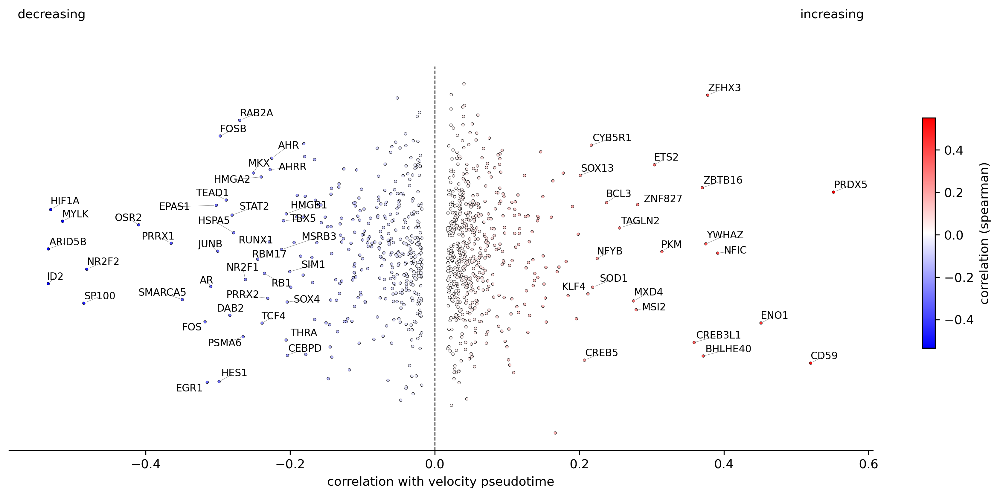

In [29]:
# # Manually create jittered y-values
tdf['y_jitter'] = np.random.normal(loc=0, scale=0.1, size=len(tdf))

# Create figure and axis
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)

# Plot scatter
sc = sns.scatterplot(
    data=tdf,
    x='correlation',
    y='y_jitter',
    hue='correlation',
    palette='bwr',
    edgecolor='k',
    linewidth=0.25,
    s=5,
    legend=False,
    zorder=3,
    ax=ax
)

# genes_to_include = ['RBFOX2', 'BCL3', 'JUN']

# Annotate genes with large correlations
texts = []
target_x = []
target_y = []
# for _, row in tdf[(abs(tdf['corr']) > 0.35) | (tdf['gene'].isin(genes_to_include))].iterrows(): # 0.35
for _, row in tdf[abs(tdf['correlation']) > 0.2].iterrows():
    texts.append(ax.text(
        row['correlation'],
        row['y_jitter'],
        row['gene'],
        fontsize=8,
        ha='center',
        va='bottom',
        zorder=4
    ))
    target_x.append(row['correlation'])
    target_y.append(row['y_jitter'])

adjust_text(
    texts,
    target_x=target_x,
    target_y=target_y,
    expand_text=(1.2, 2),
    avoid_self=True,
    ax=ax,
    arrowprops=dict(arrowstyle='-', lw=0.3, color='gray'),
    force_text=(0.75, 0.75),
)

# Add colorbar centered on right margin
norm = Normalize(vmin=tdf['correlation'].min(), vmax=tdf['correlation'].max())
sm = ScalarMappable(cmap='bwr', norm=norm)
sm.set_array([])

# Use bbox_to_anchor to shift right
cax = inset_axes(
    ax,
    width="1.5%", height="60%",
    bbox_to_anchor=(1.05, 0.25, 1, 1),  # (x0, y0, width, height) in axes fraction
    bbox_transform=ax.transAxes,
    loc='lower left'
)
cbar = fig.colorbar(sm, cax=cax)
cbar.set_label('correlation (spearman)')

# Plot formatting
ax.axvline(x=0, c='k', lw=0.75, ls='--', zorder=0)
ax.set_xlabel('correlation with velocity pseudotime')
ax.set_ylabel('')
ax.set_yticks([])
sns.despine(left=True)
plt.tight_layout()

# Direction labels
ax.text(0.01, 1.15, "decreasing", transform=ax.transAxes, ha='left', va='top', fontsize=10)
ax.text(0.99, 1.15, "increasing", transform=ax.transAxes, ha='right', va='top', fontsize=10)

plt.show()

In [33]:
# save velocity ordering

cell_ordering = adata.obs[['mean_velocity_pseudotime']].copy()
print(cell_ordering.shape)

cell_ordering.to_csv("/scratch/indikar_root/indikar1/shared_data/hematokytos/new_processed/velocity_pseudotime_order.csv")

cell_ordering.head()

(15317, 1)


,mean_velocity_pseudotime
AAACCCAAGGTTACCT-1_hsc,0.780949
AAACCCAAGTTGAAGT-1_hsc,0.914520
AAACCCAAGTTGTCGT-1_hsc,0.268672
AAACCCACAGAAGCGT-1_hsc,0.268030
AAACCCACAGGAGGTT-1_hsc,0.875203


In [34]:
adata

AnnData object with n_obs × n_vars = 15317 × 23434
    obs: 'batch', 'barcoded_phase', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'S_score', 'G2M_score', 'phase', 'leiden', 'cluster_str', 'dpt_pseudotime', 'dpt_groups', 'dpt_order', 'dpt_order_indices', 'G1_pseudotime', 'G1_order', 'G2M_pseudotime', 'G2M_order', 'mean_pseudotime', 'mean_order', 'velocyto_cell_id', 'cell_id', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'velocity_self_transition', 'velocity_pseudotime', 'G1_velocity_pseudotime', 'G2M_velocity_pseudotime', 'mean_velocity_pseudotime', 'cluster'
    var: 'gene_id', 'g

# Diffusion pseudotime